In [1]:
import sys
!{sys.executable} -m pip install --upgrade https://github.com/aparrish/bezmerizing/archive/master.zip

  Using cached https://github.com/aparrish/bezmerizing/archive/master.zip
  Created wheel for bezmerizing: filename=bezmerizing-0.1.1-py3-none-any.whl size=17284 sha256=507698b818ad554d74cd95caa79b4154c2d7f3ba65dc536b8e92ddb26d5e8797
  Stored in directory: /private/var/folders/zw/zqwd5pss4wnbkjr938715lkc0000gn/T/pip-ephem-wheel-cache-7ps14av6/wheels/74/5a/7d/4a62c2490b6c6061916e41ae070caaed12664893aef1a56d7c
Successfully built bezmerizing
  Attempting uninstall: bezmerizing
    Found existing installation: bezmerizing 0.1.1
    Uninstalling bezmerizing-0.1.1:
      Successfully uninstalled bezmerizing-0.1.1


In [2]:
# import serial
# serial = serial.Serial("/dev/tty.usbmodem14301")

In [3]:
from flat import document, rgb, rgba, font, strike, shape
from flat.command import moveto, quadto, curveto, lineto, closepath
from bezmerizing import Polyline, Path
import numpy as np
from copy import copy
from numpy.random import uniform, normal, choice

In [4]:
from IPython.display import SVG, display
def show(page):
    display(SVG(page.svg()))

In [5]:
f = font.open('VT323-Regular.ttf')

In [6]:
def glyphcommands(f, ch):
    return Path([copy(cmd) for cmd in f.glyph(f.charmap[ord(ch)])])
def advancefor(f, ch):
    return f.advances[f.charmap[ord(ch)]]

In [7]:
def getCommandsFromFont(text, font):
    t = open('/Users/samheckle/Documents/school/spring 2021/printerRobot/letterCommands.h', "w")
    
    startX = 0
    
    myText = text #the text to manipulate
    numLets = len(myText)

    letterCommands = []

    for i in range(numLets): #for every letter:
        letter = glyphcommands(font,myText[i]).commands #get glyph commands for that letter
        for j in range(len(letter)): #for each command: 
            if (hasattr(letter[j], "x") and hasattr(letter[j], "y")): #if command is NOT closepath:
                x = letter[j].x+startX
                y = letter[j].y
                letterCommands.append([x-36,(y+560)*-1])
            if (letter[j] == letter[-1]): #if command is the last in the letter:
                startX+=350
    
    commandsString = "int letterCommands[][2] = " + str(letterCommands).replace('[', "{").replace("]","}")+";"
#     print(letterCommands)
    return letterCommands

        
getCommandsFromFont("t", f)

[[164, -480],
 [284, -480],
 [288, -520],
 [284, -560],
 [124, -560],
 [120, -520],
 [124, -480],
 [84, -480],
 [80, -440],
 [84, -400],
 [80, -360],
 [84, -320],
 [80, -280],
 [84, -240],
 [4, -240],
 [0, -200],
 [4, -160],
 [84, -160],
 [80, -120],
 [84, -80],
 [80, -40],
 [84, 0],
 [164, 0],
 [168, -40],
 [164, -80],
 [168, -120],
 [164, -160],
 [284, -160],
 [288, -200],
 [284, -240],
 [164, -240],
 [168, -280],
 [164, -320],
 [168, -360],
 [164, -400],
 [168, -440],
 [164, -480]]

In [8]:
import json
import markovify

# Get raw text as string.
with open("corpus.txt") as f:
    text = f.read()

# Build the model.
text_model = markovify.NewlineText(text)

print(text_model)
model_json = text_model.to_json()

# Print five randomly-generated sentences
for i in range(5):
    print(text_model.make_sentence(tries=100))

# # Print three randomly-generated sentences of no more than 280 characters
# for i in range(3):
#     print(text_model.make_short_sentence(140, state_size=2))

When the day of Pentecost came, they were sitting. Acts 2:1-2
When the day of Pentecost came, they were sitting. Acts 2:1-2
Surely God is my help; the Lord blesses his people with peace. Psalm 29:11
The Lord gives strength to his people; the Lord is the one who sustains me. Psalm 54:4
The Lord gives strength to his people; the Lord is the one who sustains me. Psalm 54:4


In [9]:
import xml.etree.ElementTree as ET
lang = 'English'
root = ET.fromstring(open(lang + '.xml').read())
with open(lang + '.txt', 'w', encoding='utf-8') as out:
    for n in root.iter('seg'):
        out.write(n.text.strip() + '\n')


In [10]:
import json
import markovify
import random

# Opening JSON file
f = open('verses.json')

data = json.load(f)

print(data[0]["book"])

# Get raw text as string.
with open("English.txt") as f:
    text = f.read()

# Build the model.
text_model = markovify.NewlineText(text)

print(text_model)
model_json = text_model.to_json()

print(random.randrange(int(data[random.randrange(65)]['chapter'])))

# Print five randomly-generated sentences
for i in range(5):
    print(text_model.make_sentence() + " " + data[random.randrange(65)]['book'] 
          + " " + str(random.randrange(int(data[random.randrange(65)]['chapter']))))

# # Print three randomly-generated sentences of no more than 280 characters
# for i in range(3):
#     print(text_model.make_short_sentence(140, state_size=2))

Genesis
107
And it shall be a cubit high: whereupon also they laid their hands oft, eat not, holding the Head, from which ye shall know that ye may possess this land: must I do the works of the prison. Deuteronomy 6
For indeed the hand of the LORD God of my house is risen up, and thrust them into Pharaoh's house. 1 Corinthians 10
To another the working of his mouth as the LORD appeared unto him the twelve, and began to reign. Jonah 2
As the cloud the garment thereof, and the things that are among the beasts, and they have prescribed; Nehemiah 16
O house of the house of his fathers, and was dead; and, behold, there is a people near unto me. Ezekiel 13


In [11]:
import json
import markovify
import random

# Opening JSON file
f = open('verses.json')

data = json.load(f)

# Get raw text as string.
with open("English.txt") as f:
    text = f.read()

# Build the model.
text_model = markovify.NewlineText(text)

# Print five randomly-generated sentences
for i in range(5):
    print(text_model.make_sentence() + " " + data[random.randrange(64)]['book'] 
          + " " + str(random.randrange(int(data[random.randrange(64)]['chapter'])))
          + ":" + str(random.randrange(int(data[random.randrange(64)]['verse'])))
         + "\n")


Should it be good or bad: as the LORD are true men; leave one of the faith which once he destroyed. Numbers 0:1073

And as many as were all the men of Babylon: and her witchcrafts are so evil; surely thus saith the Lord thy God hath given thee. Philippians 23:329

Like sheep they are fallen under my body, which is lawful and right, he shall be widows, and your vineyards, and eat flesh in water, and be not afraid, ye beasts in the company that are sent by posts into all the people go. Matthew 2:7

Mercy and truth be in the third part shall be mighty upon the water, and spread it before thee. Zephaniah 0:42

Then I proclaimed a fast that which was sealed according to the cities of Judah did evil in thee be strong. Romans 1:99



In [12]:
# Print five randomly-generated sentences
for i in range(5):
    print(text_model.make_short_sentence(140) + " " + data[random.randrange(64)]['book'] 
          + " " + str(random.randrange(int(float(data[random.randrange(64)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randrange(64)]['verse']))))
         + "\n")

And the priest shall wash his clothes, and covered him with the sword. 2 Samuel 11:129

I reckoned till morning, that, as a tender one, and they shall rise, and shall have an issue of blood stanched. Ephesians 2:994

And these are they not pay toll, tribute, or custom, upon them. Romans 2:23

He that findeth wisdom, and knowledge, and he sold them into the house of habitation for the consolation. Joshua 19:6

Keep the sabbath days, or to say, not of the women, and the bowls, and covers thereof, and the LORD be not moved. Galatians 1:6



In [13]:
verses = []

# Print five randomly-generated sentences
for i in range(5):
    verses.append(text_model.make_short_sentence(140) + " " + data[random.randrange(64)]['book'] 
          + " " + str(random.randrange(int(float(data[random.randrange(64)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randrange(64)]['verse']))))
         + "\n")
    print(verses[i])

Again Esther spake yet again to Pilate. Matthew 15:9

Neither did Manasseh his father: and Rehoboam his son reigned in his estate shall stand upon the enemy. Deuteronomy 5:106

My soul is poured out a man say ought unto you, Whatsoever ye shall be the greatest. Joshua 0:712

And all the day. 2 Thessalonians 51:24

Which some professing have erred through wine, and men shall be exalted. 1 John 3:763



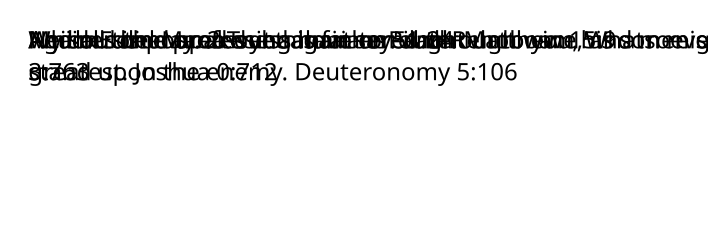

In [14]:


f = font.open("./GebetbuchFraktur.ttf")

d = document(250, 80, 'mm')
page = d.addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(128, 128, 128, 255)).width(4)
text_pen = strike(f).color(rgba(0, 0, 0, 255)).size(24, 32)

for i in range(len(verses)):
    page.place(text_pen.text(verses[i])).frame(10, 10, 260, 60)
show(page)

Clouds and darkness was under their wings. Titus 1:446

And they went from him, and sent him out of the herd, and fetcht a calf and a stranger in the ears of corn. 2 Kings 1:556

Moreover the Nethinims dwelt in the third day. Numbers 1:190

All the oxen for an everlasting name? Song of Solomon 0:17

They shall take hold on his father's servants had violently taken away. 1 Thessalonians 0:902



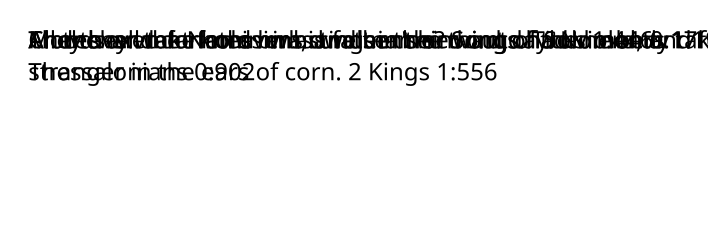

In [15]:
random.seed(40)
random_index = random.randint(0,65)

verses = []

# Print five randomly-generated sentences
for i in range(5):
    verses.append(text_model.make_short_sentence(140) + " " + data[random.randint(0,random_index)]['book'] 
          + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse']))))
         + "\n")
    print(verses[i])

f = font.open("./GebetbuchFraktur.ttf")

d = document(250, 80, 'mm')
page = d.addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(128, 128, 128, 255)).width(4)
text_pen = strike(f).color(rgba(0, 0, 0, 255)).size(24, 32)

for i in range(len(verses)):
    page.place(text_pen.text(verses[i])).frame(10, 10, 260, 60)
show(page)

In [16]:
verses = []

# Print five randomly-generated sentences
for i in range(5):
    verses.append(text_model.make_short_sentence(140) + " " + data[random.randint(0,random_index)]['book'] 
          + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

def getCommandsFromFont(text, font):
    startX = 0
    
    myText = text #the text to manipulate
    numLets = len(myText)

    letterCommands = []

    for i in range(numLets): #for every letter:
        letter = glyphcommands(font,myText[i]).commands #get glyph commands for that letter
        for j in range(len(letter)): #for each command: 
            if (hasattr(letter[j], "x") and hasattr(letter[j], "y")): #if command is NOT closepath:
                x = letter[j].x+startX
                y = letter[j].y
                letterCommands.append([x-36,(y+560)*-1])
            if (letter[j] == letter[-1]): #if command is the last in the letter:
                startX+=350
    
    commandsString = "int letterCommands[][2] = " + str(letterCommands).replace('[', "{").replace("]","}")+";"
#     print(letterCommands)
    return letterCommands

f = font.open("./GebetbuchFraktur.ttf")
getCommandsFromFont(verses[0], f)

[[482, -552],
 [591, -441],
 [575, -429],
 [562, -416],
 [549.5, -305.0],
 [545, -195],
 [545, 112],
 [579, 182],
 [576, 195],
 [558, 199],
 [510, 109],
 [481.5, 70.5],
 [453, 35],
 [455, -9],
 [453.0, -56.0],
 [447, -122],
 [441.5, -187.0],
 [440, -234],
 [440, -354],
 [460, -426],
 [481, -469],
 [472, -503],
 [464, -535],
 [470.0, -546.5],
 [482, -552],
 [441, -568],
 [446, -551],
 [420, -248],
 [420, 49],
 [420, 75],
 [421, 103],
 [421, 107],
 [397, 184],
 [400, 138],
 [403.5, 111.0],
 [405, 93],
 [401, 67],
 [391, 45],
 [342.5, 89.0],
 [312, 117],
 [202, 172],
 [88, 110],
 [-1, 44],
 [-16, -3],
 [4, -113],
 [32, -133],
 [96, -149],
 [131, -189],
 [96, -230],
 [37, -254],
 [52, -264],
 [62.0, -262.5],
 [72, -261],
 [135, -219],
 [161, -143],
 [148, -88],
 [106, -45],
 [44, -40],
 [21, -28],
 [19, -13],
 [27.0, 20.5],
 [47.5, 47.5],
 [77.0, 65.5],
 [112, 72],
 [129.5, 73.5],
 [147, 75],
 [265, 19],
 [323, -97],
 [299, -160],
 [275, -209],
 [167, -314],
 [97.5, -357.0],
 [73, -372],
 

In [17]:
verses = []

# Print five randomly-generated sentences
for i in range(5):
    verses.append(text_model.make_short_sentence(140) + " " + data[random.randint(0,random_index)]['book'] 
          + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

def getCommandsPolyline(text, font):
    startX = 0
    
    myText = text #the text to manipulate
    numLets = len(myText)

    letterCommands = []

    for i in range(numLets): #for every letter:
        letter = glyphcommands(font,myText[i]).commands #get glyph commands for that letter
        for j in range(len(letter)): #for each command: 
            if (hasattr(letter[j], "x") and hasattr(letter[j], "y")): #if command is NOT closepath:
                x = letter[j].x+startX
                y = letter[j].y
                letterCommands.append([x-36,(y+560)])
            if (letter[j] == letter[-1]): #if command is the last in the letter:
                startX+=350
    
    commandsString = "int letterCommands[][2] = " + str(letterCommands).replace('[', "{").replace("]","}")+";"
#     print(letterCommands)
    return letterCommands

f = font.open("./GebetbuchFraktur.ttf")

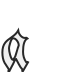

In [18]:
a_glyph = Path(f.glyph(f.charmap[ord("a")]))
a_glyph = a_glyph.translate(0, f.density).scale(72 / f.density)
page = document(72, 72, 'pt').addpage()
pen = shape().stroke(rgb(40, 40, 40)).fill(rgb(240, 240, 240)).width(2)
page.place(pen.path(a_glyph))
show(page)

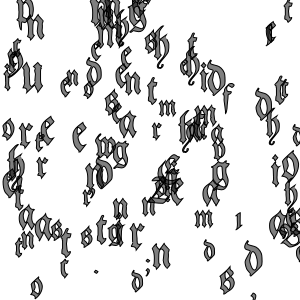

In [19]:
s = verses[0]
page = document(300, 300, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 128))
factor = 36 / f.density
cx = 0
for ch in s:
    glyph_path = (glyphcommands(f, ch)
                  .scale(factor * uniform(0.75, 1.5))
                  .translate(factor + uniform(300), factor + uniform(300)))
    page.place(pen.path(glyph_path))
    cx += advancefor(f, ch) * factor
show(page)

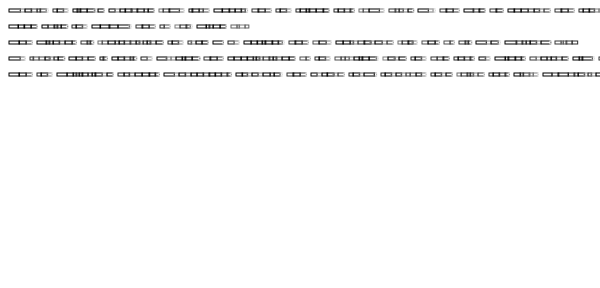

In [20]:
width = 600 # 5in
height = 288 # 4in
border = 9 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border  
xoff = border
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        path_len = len(glyphcommands(f, ch).commands)
        val = 255 - (path_len * 5)
        advance = advancefor(f, ch) / f.density * lineheight
        brush = shape().stroke(rgb(val, val, val))
        page.place(brush.rectangle(xoff, yoff, advance, rectsize))
        xoff += int(advance)
    xoff = border
    yoff += lineheight
show(page)

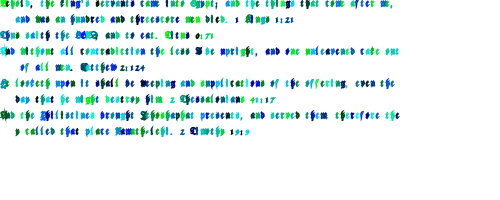

In [21]:
width = 500 # 5in
height = 200 # 4in
border = 1 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border  
xoff = border
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
#             advance = advancefor(f, ch) / f.density * lineheight
            figure = shape().stroke(rgb(0, random.randint(0,255), random.randint(0,255)))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            
            page.place(lines)
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

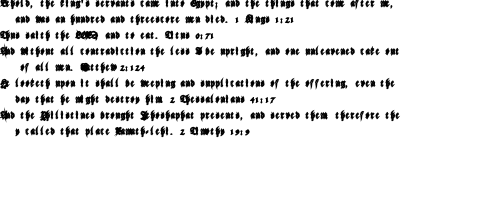

In [22]:
width = 500 # 5in
height = 200 # 4in
border = 1 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border  
xoff = border
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
#             advance = advancefor(f, ch) / f.density * lineheight
            figure = shape().stroke(rgb(0, 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            
            page.place(lines)
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

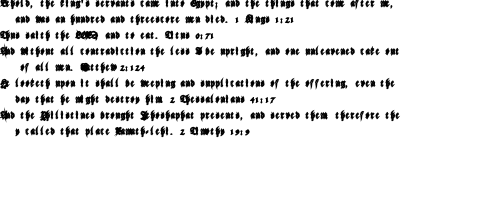

In [23]:
width = 500 # 5in
height = 200 # 4in
border = 1 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border  
xoff = border
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
#             advance = advancefor(f, ch) / f.density * lineheight
            figure = shape().stroke(rgb(0, 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            
            page.place(lines)
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

In [45]:
with open("test4.svg", "wb") as fh:
    fh.write(page.svg())

# VIOLA SAID THE BIBLE IS MEANT TO BE RED
READ

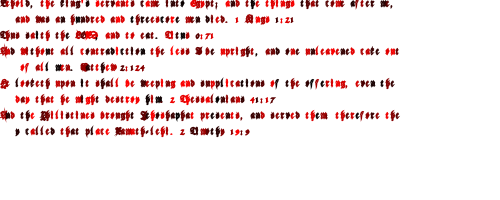

In [25]:
width = 500 # 5in
height = 200 # 4in
border = 1 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border  
xoff = border
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            
            page.place(lines)
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

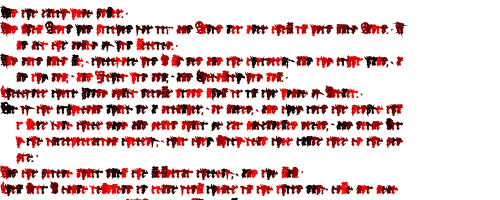

In [34]:
width = 500 # 5in
height = 200 # 4in
border = 2 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
            lines = figure.polyline(pline.rotate(uniform(.5*np.pi)).scale(.01).translate(xoff,yoff))
            page.place(lines)
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

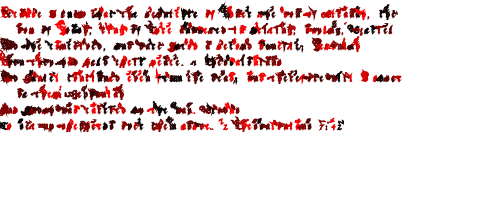

In [42]:
verses = []

# Print five randomly-generated sentences
for i in range(5):
    verses.append(text_model.make_short_sentence(140) + " " + data[random.randint(0,random_index)]['book'])
    if(i >=4):
         verses.append(text_model.make_short_sentence(140) + " " + data[random.randint(0,random_index)]['book']
          + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 500 # 5in
height = 200 # 4in
border = 2 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
            lines = figure.polyline(pline.rotate(uniform(2*np.pi)).scale(.01).translate(xoff,yoff))
            page.place(lines)
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

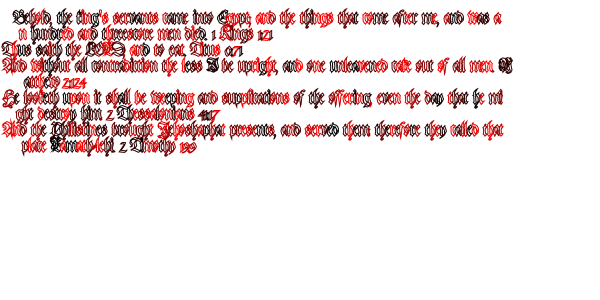

In [28]:
width = 600 # 5in
height = 300 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.02).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

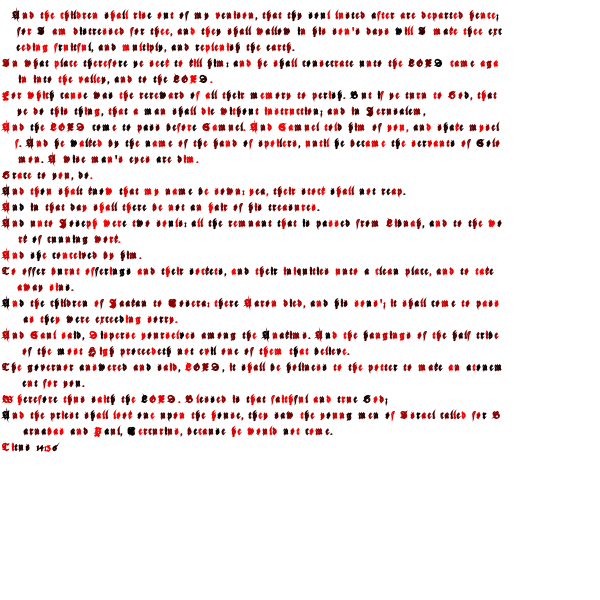

In [47]:
verses = []

num = 15
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test5.svg", "wb") as fh:
    fh.write(page.svg())

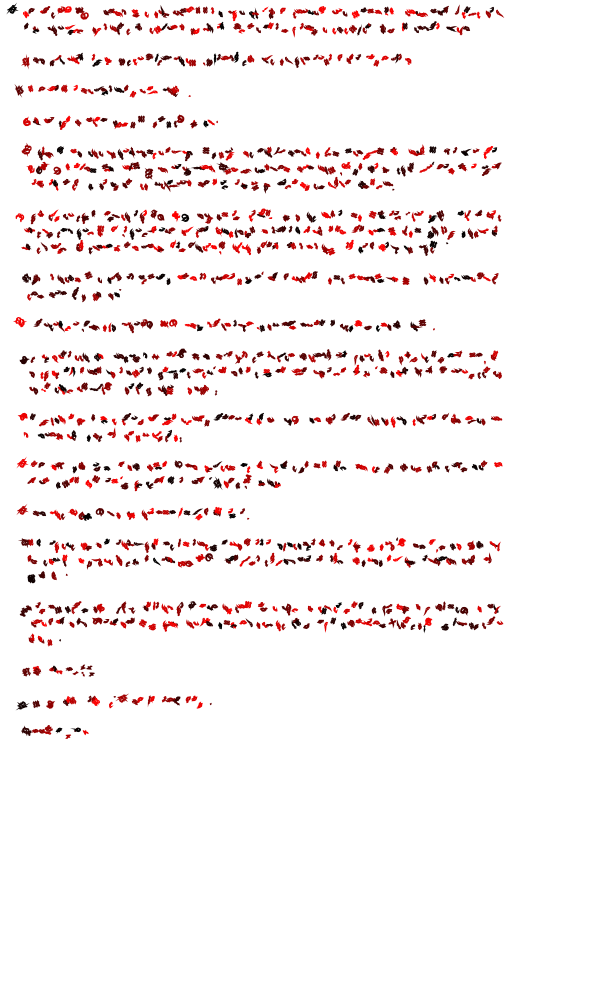

In [44]:
verses = []

num = 15
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-2):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 1000 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.rotate(uniform(random.randint(0,3)*np.pi)).scale(.01).translate(xoff,yoff))
            # bingo bango bongo
#             print(pline.rotate(uniform(random.randint(0,3)*np.pi)).scale(.02).translate(xoff,yoff).vertices)
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 20
        xoff += int(advance)
        
    xoff = border + 20
    yoff += lineheight + 15
show(page)

In [31]:
def make_cursed_verse():
    
    verse_points = []
    
    verses = []

    num = 15
    for i in range(num):
        verses.append(text_model.make_short_sentence(280))
        if(i >= num-2):
            verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
              + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

    width = 600 # 5in
    height = 800 # 4in
    border = 3 # 1/8in
    lineheight = 16 # size of each line
    yoff = border+10  
    xoff = border+10
    cmds = []
    for line in verses:
        line = line.strip() # remove trailing whitespace
        for ch in line:
            cmds = getCommandsPolyline(ch, f)
            if(cmds):
                figure = shape().stroke(rgb(random.randint(0,255), 0,0))
                pline = Polyline(cmds)
                lines = figure.polyline(pline.rotate(uniform(random.randint(0,3)*np.pi))
                                        .scale(.02)
                                        .translate(xoff,yoff))
                # bingo bango bongo
                verse_points.append(pline.rotate(uniform(random.randint(0,3)*np.pi)).scale(.02).translate(xoff,yoff).vertices)
                page.place(lines)
            advance = advancefor(f, ch) / f.density * lineheight
            if(xoff+advance+100 >= width):
                yoff += lineheight + 20
                xoff = border + 20
            xoff += int(advance)

        xoff = border + 20
        yoff += lineheight + 30
    return verse_points

In [32]:
make_cursed_verse()

[array([[ 2.68562192, 11.13967617],
        [ 0.94842837, 12.33907543],
        [ 1.16828035, 12.78456965],
        [ 1.64754149, 12.51124061],
        [ 2.09694705, 12.02458401],
        [ 2.82924638, 11.97834894],
        [ 3.15220958, 12.08877887],
        [ 3.45575298, 12.19442645],
        [ 7.89072798, 15.34634597],
        [10.46109438, 15.19662428],
        [12.84421432, 14.2180849 ],
        [13.54940804, 13.36187125],
        [13.74440042, 12.9464462 ],
        [14.02098337, 12.283346  ],
        [14.59473045, 11.29177438],
        [13.81604256,  9.18444309],
        [13.47909103,  8.54533146],
        [13.56995599,  8.1763551 ],
        [14.10153281,  7.60694655],
        [14.97397248,  7.40984503],
        [14.75499153,  7.2117356 ],
        [13.84371224,  7.3992724 ],
        [12.95243344,  7.75651476],
        [13.1764871 ,  8.01766598],
        [12.79548639,  8.64475326],
        [12.49245526,  9.3734316 ],
        [12.48637465, 10.40181044],
        [12.76028438, 11.045

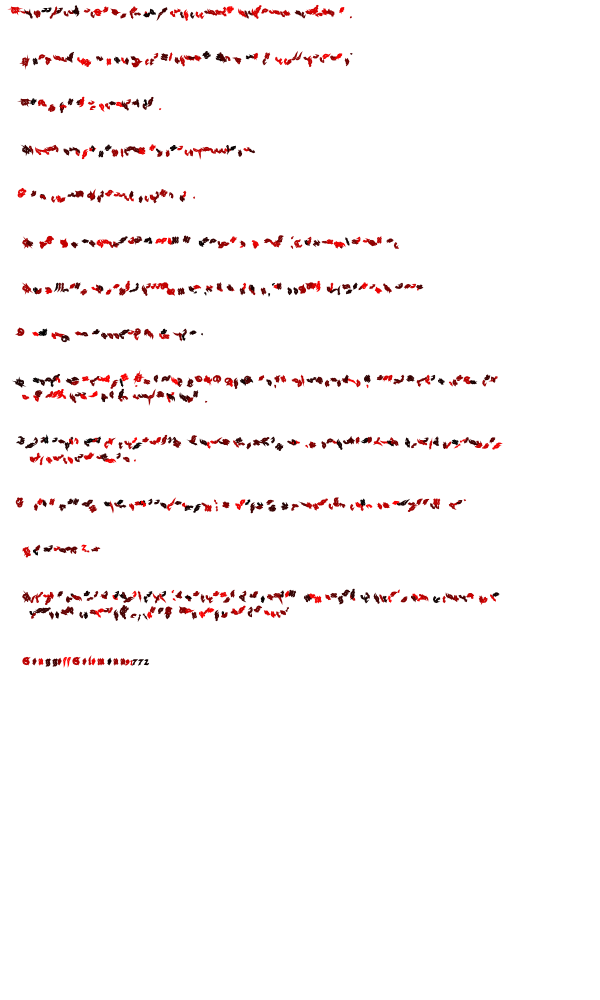

In [50]:
verses = []

num = 15
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-2):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 1000 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
        if(line != verses[len(verses)-1]):
            lines = figure.polyline(pline.rotate(uniform(random.randint(0,3)*np.pi)).scale(.01).translate(xoff,yoff))
        else:
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
        page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 20
        xoff += int(advance)
        
    xoff = border + 20
    yoff += lineheight + 30
show(page)

with open("test7.svg", "wb") as fh:
    fh.write(page.svg())

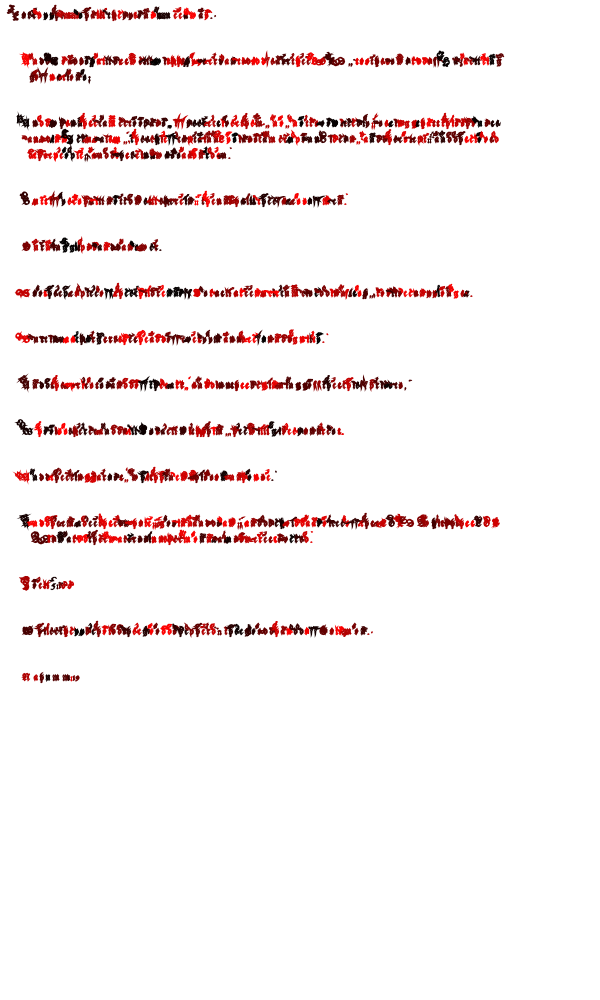

In [51]:
verses = []

num = 12
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-2):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 1000 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
        if(line != verses[len(verses)-1]):
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
            lines = figure.polyline(pline.rotate(uniform(random.randint(0,3)*np.pi)).scale(.01).translate(xoff,yoff))
        else:
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
        page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 20
        xoff += int(advance)
        
    xoff = border + 20
    yoff += lineheight + 30
show(page)

with open("test8.svg", "wb") as fh:
    fh.write(page.svg())

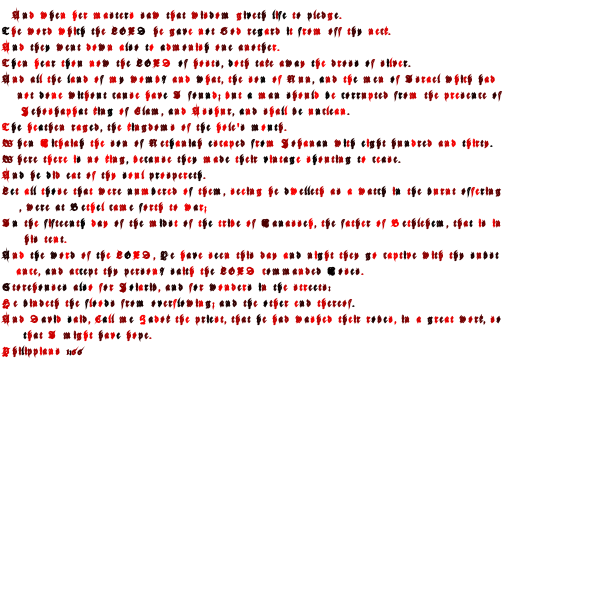

In [52]:
verses = []

num = 15
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test9.svg", "wb") as fh:
    fh.write(page.svg())

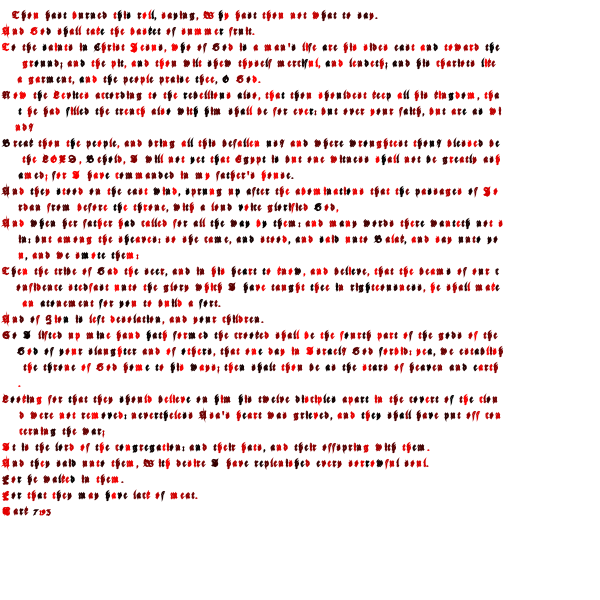

In [53]:
verses = []

num = 15
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test10.svg", "wb") as fh:
    fh.write(page.svg())

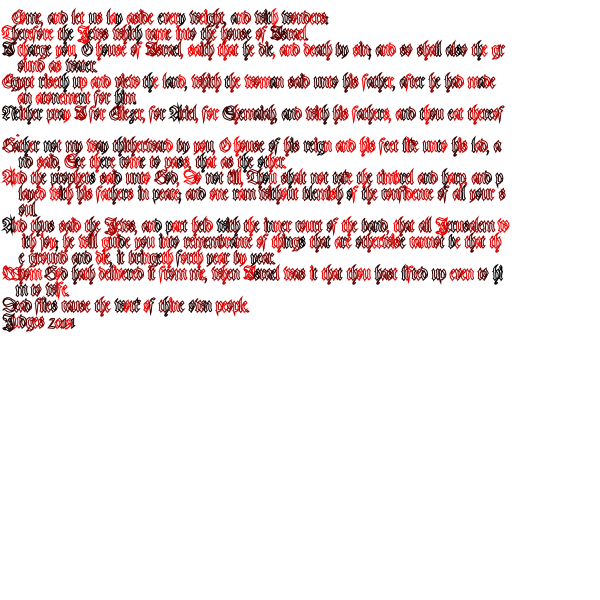

In [55]:
verses = []

num = 10
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.02).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test11.svg", "wb") as fh:
    fh.write(page.svg())

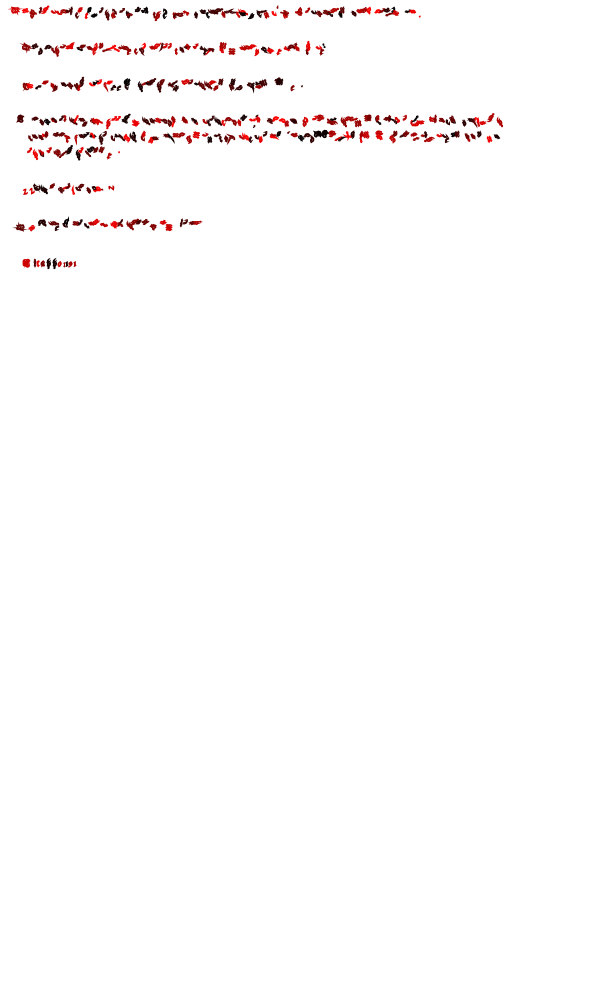

In [58]:
verses = []

num = 5
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-2):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 1000 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
        if(line != verses[len(verses)-1]):
            lines = figure.polyline(pline.rotate(uniform(random.randint(0,3)*np.pi)).scale(.01).translate(xoff,yoff))
        else:
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
        page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 20
        xoff += int(advance)
        
    xoff = border + 20
    yoff += lineheight + 20
show(page)

with open("test12.svg", "wb") as fh:
    fh.write(page.svg())

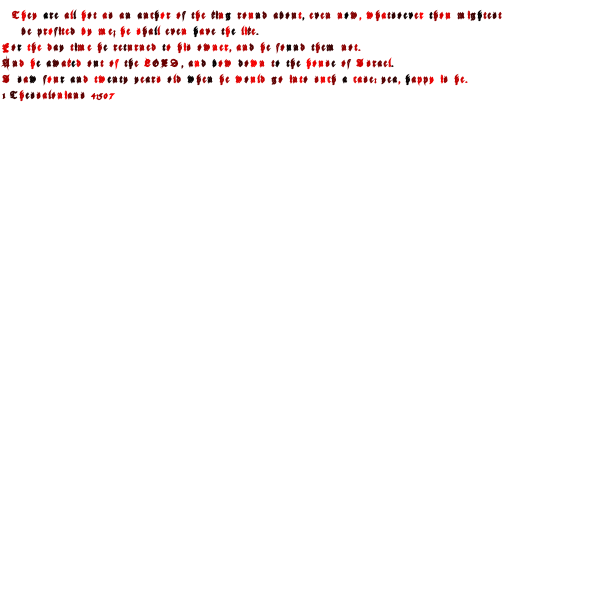

In [59]:
verses = []

num = 4
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 600 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test13.svg", "wb") as fh:
    fh.write(page.svg())

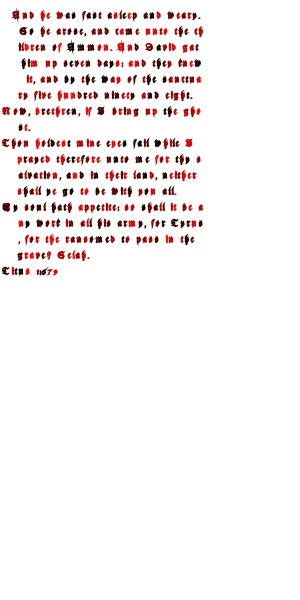

In [64]:
verses = []

num = 4
for i in range(num):
    verses.append(text_model.make_short_sentence(280))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 300 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test14.svg", "wb") as fh:
    fh.write(page.svg())

[]


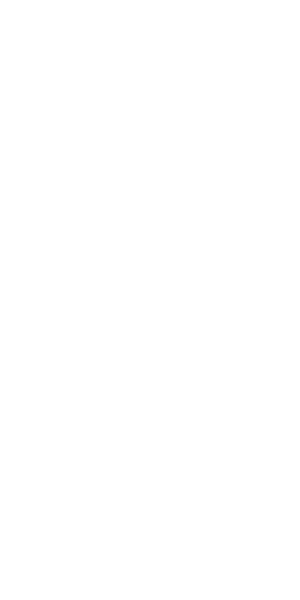

In [69]:
verses = []

# num = 4
# for i in range(num):
#     verses.append(text_model.make_short_sentence(140))
#     if(i >= num-1):
#         verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
#           + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

print(verses)

width = 300 # 5in
height = 600 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test15.svg", "wb") as fh:
    fh.write(page.svg())

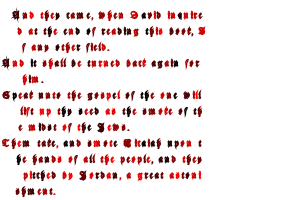

In [68]:
verses = []

num = 4
for i in range(num):
    verses.append(text_model.make_short_sentence(140))
    if(i >= num-1):
        verses.append(data[random.randint(0,random_index)]['book'] + " " + str(random.randrange(int(float(data[random.randint(0,random_index)]['chapter']))))
          + ":" + str(random.randrange(int(float(data[random.randint(0,random_index)]['verse'])))))

width = 300 # 5in
height = 200 # 4in
border = 3 # 1/8in
lineheight = 16 # size of each line
rectsize = 3 # size of each rectangle
page = document(width, height, 'pt').addpage()
yoff = border+10  
xoff = border+10
cmds = []
for line in verses:
    line = line.strip() # remove trailing whitespace
    for ch in line:
        cmds = getCommandsPolyline(ch, f)
        if(cmds):
            figure = shape().stroke(rgb(random.randint(0,255), 0,0))
            pline = Polyline(cmds)
            lines = figure.polyline(pline.scale(.01).translate(xoff,yoff))
            page.place(lines)
        advance = advancefor(f, ch) / f.density * lineheight
        if(xoff+advance+100 >= width):
            yoff += lineheight
            xoff = border + 10
        xoff += int(advance)
        
    xoff = border
    yoff += lineheight
show(page)

with open("test16.svg", "wb") as fh:
    fh.write(page.svg())